In [21]:
import pandas as pd
from sqlalchemy import create_engine
from tqdm import tqdm
import urllib
from sqlalchemy import text

tqdm.pandas()

import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
from scipy.ndimage import gaussian_filter
import random

In [22]:

conn_string_odbc="Driver={ODBC Driver 18 for SQL Server};Server=tcp:smartspace.database.windows.net,1433;Database=connectionspace;Uid=stats170-G6;Pwd=cro-r5sweDlVay5t=eta;Encrypt=yes;TrustServerCertificate=no;Connection Timeout=30;"
params = urllib.parse.quote_plus(conn_string_odbc)
conn_str_formatted = 'mssql+pyodbc:///?odbc_connect={}'.format(params)
engine = create_engine(conn_str_formatted)

In [23]:
# fetch table names
conn = engine.connect()

query = text("SELECT * FROM INFORMATION_SCHEMA.TABLES WHERE TABLE_TYPE = 'BASE TABLE'")
result = conn.execute(query)
for row in result:
    print(row)

conn.close()

('connectionspace', 'dbo', 'region_to_space', 'BASE TABLE')
('connectionspace', 'dbo', 'processed_data_merged', 'BASE TABLE')
('connectionspace', 'dbo', 'class_schedule', 'BASE TABLE')
('connectionspace', 'dbo', 'dbh_space', 'BASE TABLE')
('connectionspace', 'dbo', 'processed_data4', 'BASE TABLE')
('connectionspace', 'dbo', 'space_groups', 'BASE TABLE')
('connectionspace', 'dbo', 'region_to_coverage', 'BASE TABLE')
('connectionspace', 'dbo', 'space_hierarchy', 'BASE TABLE')
('connectionspace', 'dbo', 'lctr_result', 'BASE TABLE')
('connectionspace', 'dbo', 'days_of_mac', 'BASE TABLE')
('connectionspace', 'dbo', 'Processed_Data', 'BASE TABLE')
('connectionspace', 'dbo', 'enriched_result', 'BASE TABLE')
('connectionspace', 'dbo', 'sensor', 'BASE TABLE')
('connectionspace', 'dbo', 'space_types', 'BASE TABLE')
('connectionspace', 'dbo', 'processed_data3', 'BASE TABLE')


Code Start

In [24]:
# Fetch processed_data_3 table
conn = engine.connect()

query = text("SELECT * FROM processed_data4")
results = conn.execute(query)

rows = results.fetchall()
cols = results.keys()
df_processed_data3 = pd.DataFrame(rows, columns=cols)

conn.close()

df_processed_data3.head()

,macAddress,userId,startTimestamp,endTimestamp,room_location,duration,quarter,date,day_of_week,year,calendar_week,quarter_week
0,00002dc6243d2a8c5108084ba322634d8255d5df,190150,2018-03-06 19:24:50,2018-03-06 19:25:06,3039,16.0,w18,2018-03-06,1,2018,10,9.0
1,00002dc6243d2a8c5108084ba322634d8255d5df,190150,2018-03-06 19:25:06,2018-03-06 19:25:20,4232,14.0,w18,2018-03-06,1,2018,10,9.0
2,00002dc6243d2a8c5108084ba322634d8255d5df,190150,2018-03-06 19:25:20,2018-03-06 19:25:31,5062,11.0,w18,2018-03-06,1,2018,10,9.0
3,00002dc6243d2a8c5108084ba322634d8255d5df,190150,2018-03-06 19:25:31,2018-03-06 21:22:57,6011,7046.0,w18,2018-03-06,1,2018,10,9.0
4,00014c815769ff2a99662e77a228abc50f0ab012,174218,2017-11-22 09:16:23,2017-11-22 09:33:47,1407,1044.0,f17,2017-11-22,2,2017,47,8.0


In [25]:

df_floor2 = df_processed_data3[df_processed_data3['room_location'].astype(str).str.startswith('2')]

In [26]:
#counts

# Group by 'room_location' and count the occurrences
df_room_counts = df_floor2['room_location'].value_counts().reset_index()
df_room_counts.columns = ['room_location', 'counts']

room_counts_dict = dict(zip(df_room_counts['room_location'], df_room_counts['counts']))

print(room_counts_dict)



{'2061': 117313, '2019': 112740, '2013': 106744, '2208': 93113, '2226': 56440, '2069': 1503, '2099': 775, '2059': 673, '2086': 355, '2076': 298}


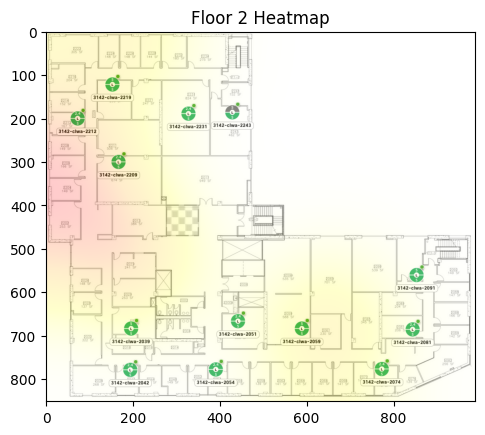

In [27]:
# Old initial floor 2 heatmap, all quarters non-split


offset = 40


Floor2 = {'2226': (190, 50), '2208': (45, 260), '2099': (760, 540), '2086': (940, 645),
          '2076': (840, 800), '2069': (650, 569), '2061': (645, 688), '2059': (558, 648),
          '2019': (195, 536), '2013': (108, 435)}

Floor2Values = room_counts_dict


image = plt.imread("/Users/lavin/Documents/Stats170a/SmartSpaceAnalysis/DBH 2F.png")


data = np.zeros((image.shape[0], image.shape[1]))



for AP, coords in Floor2.items():
    y, x = coords
    v = 0
    if(AP in Floor2Values):
        v = Floor2Values[AP]
    data[x-offset: x+offset, y-offset: y+offset] = v

sigma = 125  # Adjust the sigma value as needed for desired smoothness
smoothed_data = gaussian_filter(data, sigma=sigma)


plt.imshow(image)

colors = [(0, "white"), (0.33, "yellow"), (0.66, "orange"), (1, "red")]
cmap = mcolors.LinearSegmentedColormap.from_list("CustomRed", colors)

plt.imshow(smoothed_data, alpha = 0.2, extent=(0, image.shape[1], image.shape[0], 0), cmap = cmap, interpolation='spline16') 
# plt.imshow(smoothed_data, alpha=0.2, extent=(0, image.shape[1], image.shape[0], 0), cmap=cmap, interpolation='nearest')

plt.title( "Floor 2 Heatmap" ) 
plt.show()  




In [28]:
# # Old floor 2 heatmap split quarters
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.colors as mcolors
# from scipy.ndimage import gaussian_filter

# Floor2 = {'2226': (190, 50), '2208': (45, 260), '2099': (760, 540), '2086': (940, 645),
#           '2076': (840, 800), '2069': (650, 569), '2061': (645, 688), '2059': (558, 648),
#           '2019': (195, 536), '2013': (108, 435)}

# image = plt.imread("/Users/lavin/Documents/Stats170a/SmartSpaceAnalysis/DBH 2F.png")

# def create_heatmap(ax, df, title):
#     df_floor2 = df[df['room_location'].astype(str).str.startswith('2')]
    
#     df_room_counts = df_floor2['room_location'].value_counts().reset_index()
#     df_room_counts.columns = ['room_location', 'counts']
    
#     room_counts_dict = dict(zip(df_room_counts['room_location'], df_room_counts['counts']))

#     data = np.zeros((image.shape[0], image.shape[1]))

#     for AP, coords in Floor2.items():
#         y, x = coords
#         v = 0
#         if AP in room_counts_dict:
#             v = room_counts_dict[AP]
#         data[x-40: x+40, y-40: y+40] = v

#     sigma = 75  
#     smoothed_data = gaussian_filter(data, sigma=sigma)

#     ax.imshow(image)

#     colors = [(0, "white"), (0.33, "yellow"), (0.66, "orange"), (1, "red")]
#     cmap = mcolors.LinearSegmentedColormap.from_list("CustomRed", colors)

#     ax.imshow(smoothed_data, alpha=0.2, extent=(0, image.shape[1], image.shape[0], 0), cmap=cmap, interpolation='spline16')
#     ax.set_title(title)
#     ax.axis('off')

# desired_order = ['summer17', 'summer17_break', 'f17', 'f17_break', 'w18', 'w18_break', 's18', 's18_break', 
#                  'summer18', 'summer18_break', 'f18', 'f18_break', 'w19', 'w19_break', 's19', '']

# quarters = [q for q in desired_order if q in df_processed_data_merged['quarter'].unique()]

# num_quarters = len(quarters)
# num_cols = 4
# num_rows = (num_quarters + num_cols - 1) // num_cols  

# fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))  

# axs = axs.flatten()

# for ax, quarter in zip(axs, quarters):
#     df_quarter = df_processed_data_merged[df_processed_data_merged['quarter'] == quarter]
#     create_heatmap(ax, df_quarter, f"{quarter}")


# plt.tight_layout()
# plt.show()


In [29]:
# Define room coordinates for all floors


floor_coordinates = {
    1: {'1100': (184, 286), '1100_L1': (128, 533), '1200': (430, 170), '1300': (430, 371), 
        '1429': (601, 905), '1433': (883, 900)},  # , '1403': (0, 0),'1406': (0, 0),'1407': (0, 0), '1413': (0, 0), '1428': (0, 0), '1434': (0, 0)
    2: {'2226': (190, 50), '2208': (45, 260), '2099': (760, 540), '2086': (940, 645),
        '2076': (840, 800), '2069': (650, 569), '2061': (645, 688), '2059': (558, 648),
        '2019': (195, 536), '2013': (108, 435)},
    3: {'3011': (347, 330), '3039': (241, 682), '3065': (745, 691), '3088': (930, 618),
        '3209': (205, 340)},  
    4: {'4019': (190, 550), '4059': (565, 622), '4066': (653, 781), '4086': (924, 662),
        '4208': (74, 268), '4232': (300, 75)}, 
    5: {'5026': (105, 588), '5029': (238, 628), '5051': (496, 704), '5054': (395, 805), 
        '5062': (562, 793), '5082': (930, 760), '5204': (65, 370), '5224': (148, 78)},  
    6: {'6011': (322, 350), '6049': (448, 713), '6082': (915, 741)}  
}

# quarter_order = ['summer17', 'summer17_break', 'f17', 'f17_break', 'w18', 'w18_break', 's18', 's18_break', 
#                  'summer18', 'summer18_break', 'f18', 'f18_break', 'w19', 'w19_break', 's19', '']
# Merge quarters 
df_processed_data3["quarter"] = df_processed_data3.quarter.str.replace("_break", "")
quarter_order = ['summer17', 'f17', 'w18', 's18', 
                 'summer18', 'f18', 'w19', 's19', '']

Color Changes

In [52]:
from matplotlib.cm import cividis, plasma, magma, inferno

# Function to create heatmap
def create_heatmap(ax, df, floor, title, coordinates, image, cmap):
    df_floor = df[df['room_location'].astype(str).str.startswith(str(floor))]
    
    # Group by 'room_location' and count entries
    df_room_counts = df_floor['room_location'].value_counts().reset_index()
    df_room_counts.columns = ['room_location', 'counts']
    
    room_counts_dict = dict(zip(df_room_counts['room_location'], df_room_counts['counts']))

    data = np.zeros((image.shape[0], image.shape[1]))

    for AP, coords in coordinates.items():
        y, x = coords
        v = 0
        if AP in room_counts_dict:
            v = room_counts_dict[AP]
        data[x-40: x+40, y-40: y+40] = v

    sigma = 150  # Adjust the sigma value as needed for desired smoothness
    smoothed_data = gaussian_filter(data, sigma=sigma)

    ax.imshow(image)

    ax.imshow(smoothed_data, alpha=0.6, extent=(0, image.shape[1], image.shape[0], 0), cmap=cmap, interpolation='spline16')
    ax.set_title(title)
    ax.axis('off')




In [53]:
# Function to create heatmap
# def create_heatmap(ax, df, floor, title, coordinates, image):
#     df_floor = df[df['room_location'].astype(str).str.startswith(str(floor))]
    
#     # Group by 'room_location' and count entries
#     df_room_counts = df_floor['room_location'].value_counts().reset_index()
#     df_room_counts.columns = ['room_location', 'counts']
    
#     room_counts_dict = dict(zip(df_room_counts['room_location'], df_room_counts['counts']))

#     data = np.zeros((image.shape[0], image.shape[1]))

#     for AP, coords in coordinates.items():
#         y, x = coords
#         v = 0
#         if AP in room_counts_dict:
#             v = room_counts_dict[AP]
#         data[x-40: x+40, y-40: y+40] = v

#     sigma = 75  # Adjust the sigma value as needed for desired smoothness
#     smoothed_data = gaussian_filter(data, sigma=sigma)

#     ax.imshow(image)

#     colors = [(0, "white"), (0.33, "yellow"), (0.66, "orange"), (1, "red")]
#     cmap = mcolors.LinearSegmentedColormap.from_list("CustomRed", colors)

#     ax.imshow(smoothed_data, alpha=0.2, extent=(0, image.shape[1], image.shape[0], 0), cmap=cmap, interpolation='spline16')
#     ax.set_title(title)
#     ax.axis('off')

# Main function to generate heatmaps for a given floor
def generate_heatmaps(df, floor, cmap):
    coordinates = floor_coordinates[floor]
    file_path = f"/Users/lavin/Documents/Stats170a/SmartSpaceAnalysis/DBH {floor}F.png"
    image = plt.imread(file_path)  # Adjust path to the floor image file


    # quarter_order = ['summer17', 'summer17_break', 'f17', 'f17_break', 'w18', 'w18_break', 's18', 's18_break', 
    #                  'summer18', 'summer18_break', 'f18', 'f18_break', 'w19', 'w19_break', 's19', '']

    # Calculate number of rows needed
    num_quarters = len(quarter_order)
    num_cols = 3
    num_rows = (num_quarters + num_cols - 1) // num_cols 

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))  

    axs = axs.flatten()

    for ax, quarter in zip(axs, quarter_order):
        # Replace None Quarters with ''
        if quarter == '':
            df_quarter = df[df['quarter'].fillna('') == '']
        else:
            df_quarter = df[df['quarter'] == quarter]

        create_heatmap(ax, df_quarter, floor, f"{quarter}", coordinates, image, cmap)


    plt.tight_layout()
    plt.show()




In [47]:
# Old processed data
# generate_heatmaps(df_processed_data_merged, 2)

In [50]:
# Usage:
# generate_heatmaps(df_processed_data_merged, 2, cmap=cividis)
# This will generate and display heatmaps for floor 2 for all the quarters.

# Choose the colormap you want to use: viridis, cividis, plasma, magma, inferno

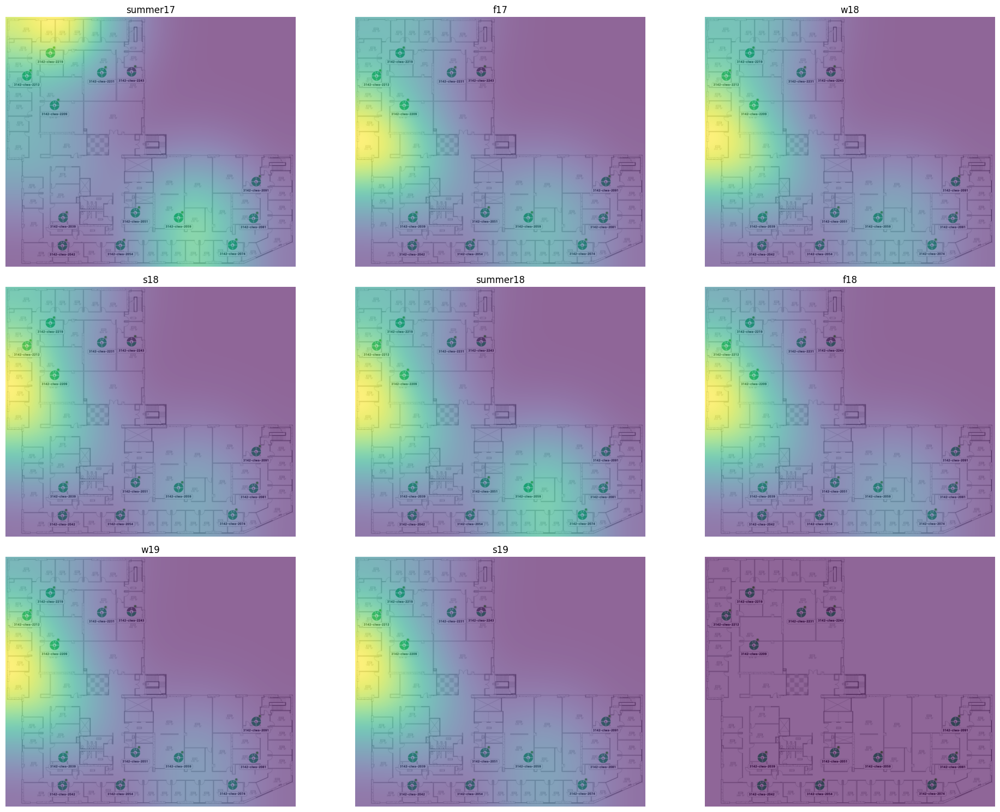

In [54]:
# Latest processed data 3
generate_heatmaps(df_processed_data3, 2, "viridis")

Heatmaps

In [34]:
# Room locations that start with '1'
rooms_starting_with_1 = df_processed_data3[df_processed_data3['room_location'].astype(str).str.startswith('1')]
unique_rooms = rooms_starting_with_1['room_location'].unique()
print(unique_rooms)

['1407' '1100_L1' '1403' '1100' '1434' '1428' '1433' '1429' '1413' '1200'
 '1406' '1300']


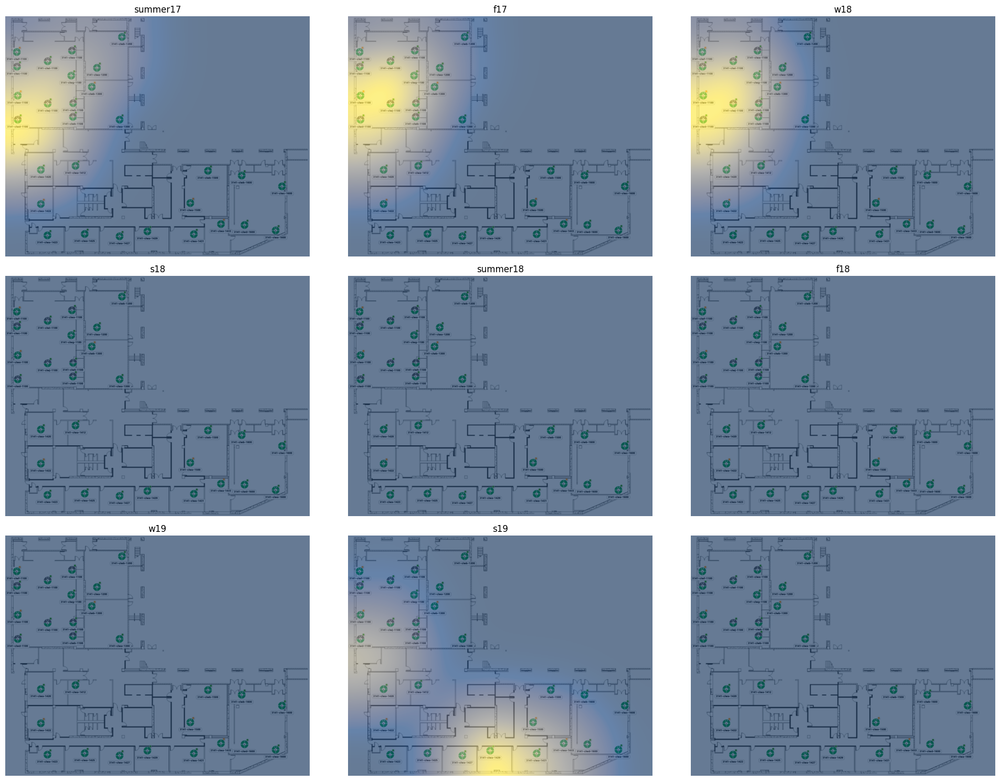

In [55]:
generate_heatmaps(df_processed_data3, 1, "cividis")

Floor 2 heatmap, 8 quarters

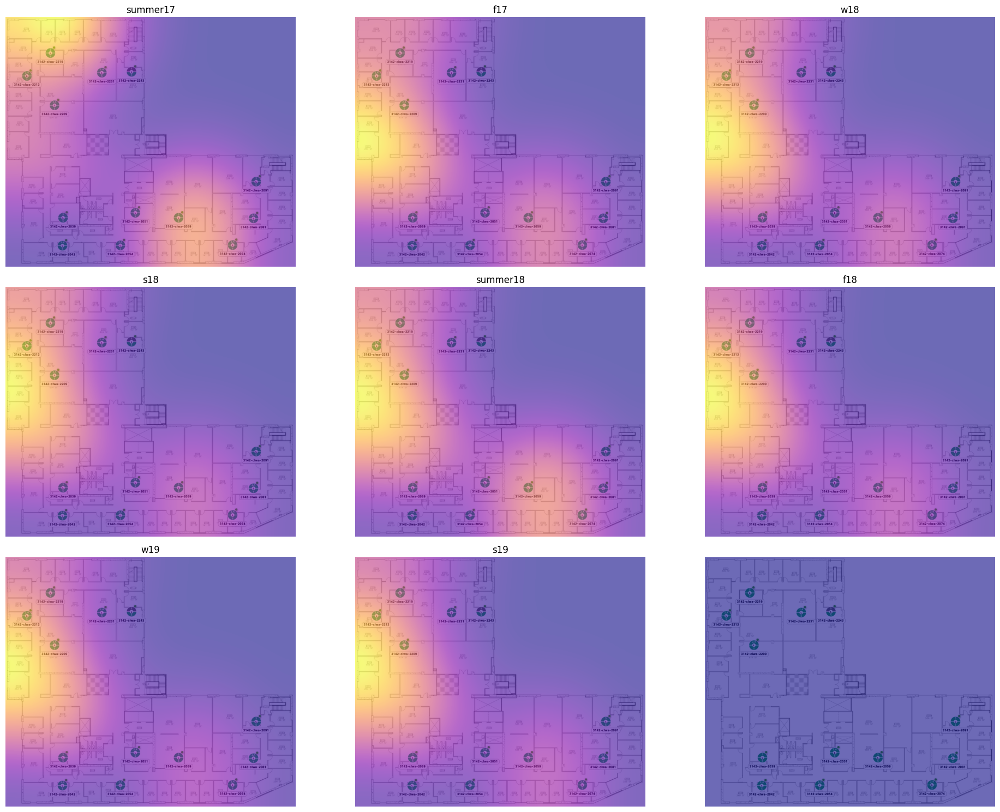

In [57]:
generate_heatmaps(df_processed_data3, 2, "plasma")

Floor 3 heatmap

In [58]:
# Room locations that start with '3'
rooms_starting_with_3 = df_processed_data3[df_processed_data3['room_location'].astype(str).str.startswith('3')]
unique_rooms = rooms_starting_with_3['room_location'].unique()
print(unique_rooms)

['3039' '3088' '3065' '3011' '3209']


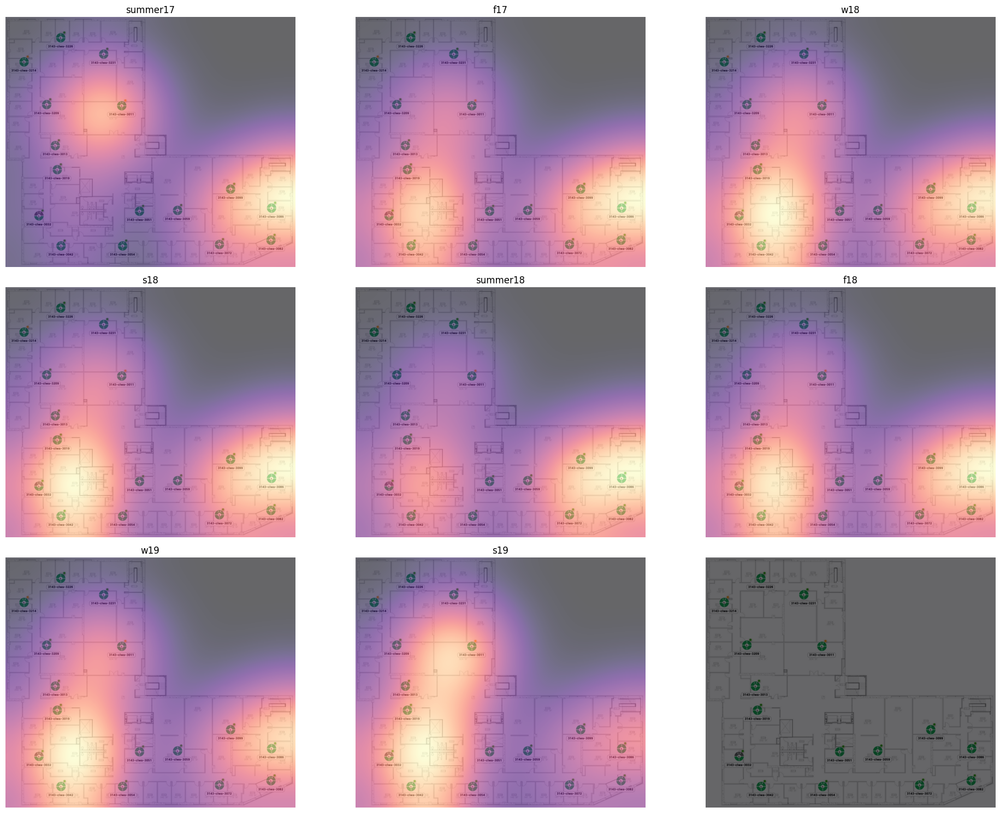

In [59]:
generate_heatmaps(df_processed_data3, 3, "magma")

In [60]:
# Room locations that start with '4'
rooms_starting_with_4 = df_processed_data3[df_processed_data3['room_location'].astype(str).str.startswith('4')]
unique_rooms = rooms_starting_with_4['room_location'].unique()
print(unique_rooms)

['4232' '4019' '4086' '4066' '4208' '4059']


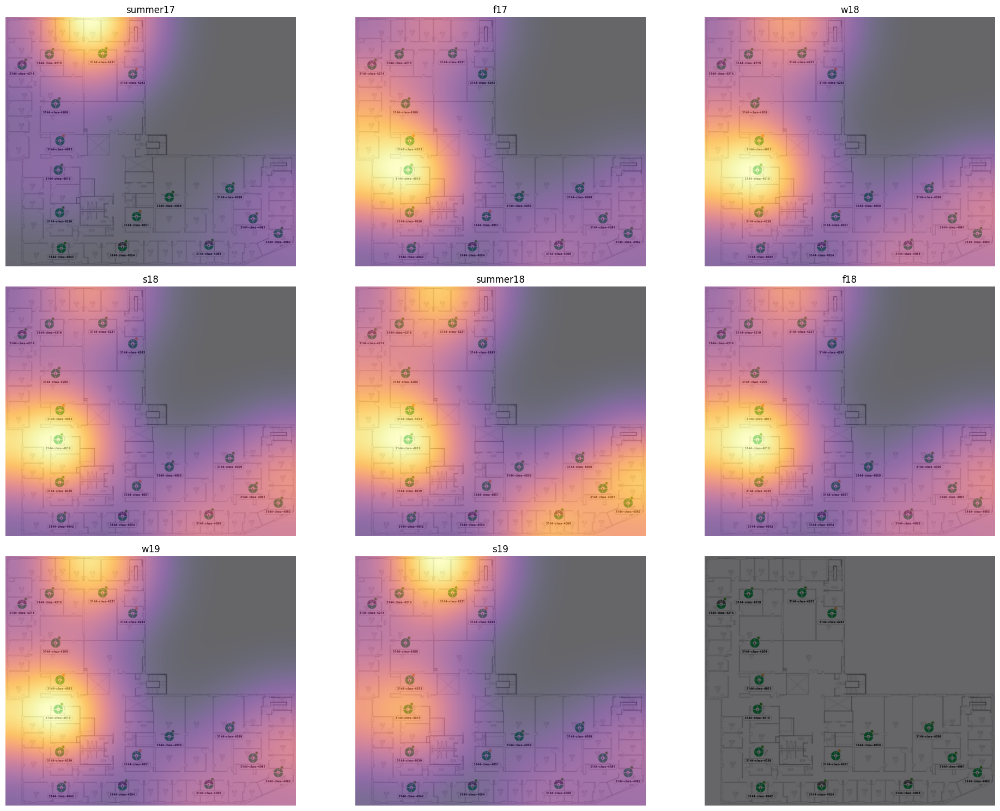

In [61]:
generate_heatmaps(df_processed_data3, 4, "inferno")

In [62]:
# Room locations that start with '5'
rooms_starting_with_5 = df_processed_data3[df_processed_data3['room_location'].astype(str).str.startswith('5')]
unique_rooms = rooms_starting_with_5['room_location'].unique()
print(unique_rooms)

['5062' '5026' '5082' '5224' '5029' '5054' '5204' '5051']


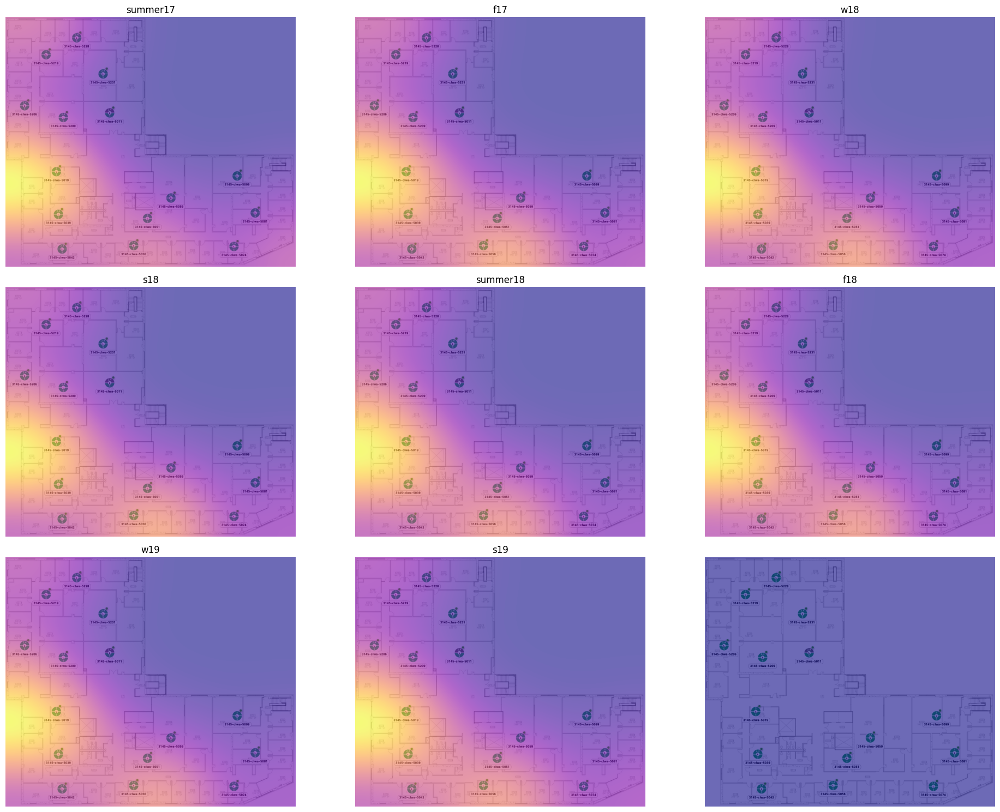

In [64]:
generate_heatmaps(df_processed_data3, 5, "plasma")

In [ ]:
# Room locations that start with '6'
rooms_starting_with_6 = df_processed_data3[df_processed_data3['room_location'].astype(str).str.startswith('6')]
unique_rooms = rooms_starting_with_6['room_location'].unique()
print(unique_rooms)

['6011' '6049' '6082']


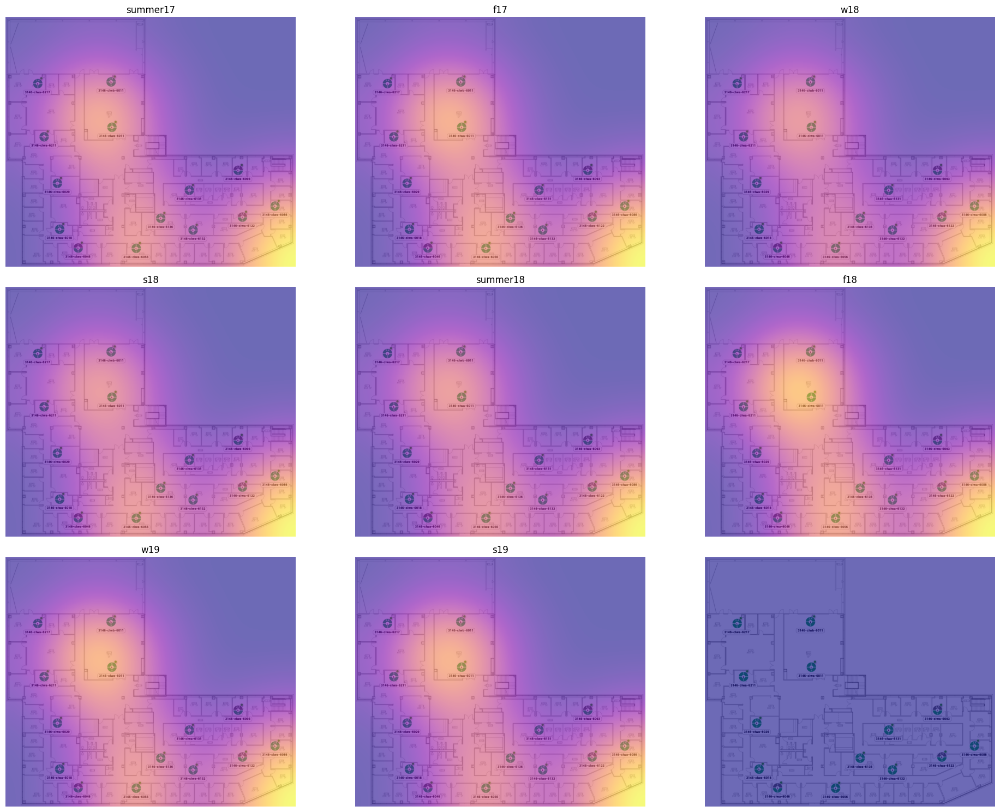

In [65]:
generate_heatmaps(df_processed_data3, 6, "plasma")